In [1]:
import pandas as pd  
import numpy as np  
import matplotlib.pyplot as plt
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier  
from sklearn.metrics import classification_report, confusion_matrix, precision_recall_fscore_support, accuracy_score  
import itertools


pdata = pd.read_csv("../Data/preprocessed_incl_steplength.csv")
pdata = pdata.drop(["Unnamed: 0.1"], axis=1)
pdata = pdata.drop(["Unnamed: 0"], axis=1)
pdata['Conditie'] = pdata['Conditie'].map({'norm': 0,  'bril': 1})
pdata

,TestID,Conditie,SubjectID,SegmentNr,WalkingDirection,SegmentData,Height,Weight,Age,BMI,std_SegmentData,Som_afstand,AverageStepLength
0,006A01',0,6,1,away,[[array([[0.04697253]]) array([[-0.18321628]])...,177,70.0,20,22.343516,0.060870,3.409617,0.610128
1,006A01',0,6,2,towards,[[array([[0.40771624]]) array([[-0.22044282]])...,177,70.0,20,22.343516,0.038465,1.934760,0.681944
2,006A01',0,6,3,away,[[array([[0.09305737]]) array([[-0.19160482]])...,177,70.0,20,22.343516,0.030903,1.357366,0.713798
3,006A01',0,6,4,towards,[[array([[0.44424376]]) array([[-0.2283845]]) ...,177,70.0,20,22.343516,0.074751,4.261516,0.651639
4,009A01',0,9,1,away,[[array([[-0.08974021]]) array([[-0.0481508]])...,195,86.0,23,22.616700,0.028861,1.569590,0.768314
5,009A01',0,9,2,towards,[[array([[0.47497733]]) array([[-0.09702823]])...,195,86.0,23,22.616700,0.029494,1.660196,0.685495
6,009A01',0,9,3,away,[[array([[0.00489379]]) array([[-0.07232992]])...,195,86.0,23,22.616700,0.017266,1.055629,0.689099
7,009A01',0,9,4,towards,[[array([[0.51498991]]) array([[-0.09675995]])...,195,86.0,23,22.616700,0.015360,0.931125,0.660362
8,010A01',0,10,1,away,[[array([[-0.33516738]]) array([[-0.30029692]]...,165,65.0,28,23.875115,0.068683,4.492418,0.538055
9,010A01',0,10,2,towards,[[array([[0.54318447]]) array([[-0.34777679]])...,165,65.0,28,23.875115,0.024063,1.929386,0.571604


In [2]:
#Splits data into training and validation according to specified ratio
def validation_split(data, ratio):
    sidlist = data['SubjectID'].unique()
    gdata = [data[data['SubjectID']==sid] for sid in sidlist]
    np.random.shuffle(gdata)
    N = len(gdata)
    training = gdata[:int(ratio*N)]
    validation = gdata[(int(ratio*N)):]
    return training,validation

# Converts the arrays in a list to one flattend dataframe
def flatten(data, variable_list):
    return pd.DataFrame(np.vstack(data), columns=variable_list)

def get_split_data(originaldata, variable_list, ratio):
    data = originaldata[variable_list]
    training,validation = validation_split(data, 0.7)
    training = flatten(training, variable_list)
    validation = flatten(validation, variable_list)

    Xtrain = training.drop(['Conditie', 'SubjectID'], axis=1)
    Ytrain = training['Conditie']
    Xtrain = Xtrain.astype(float)
    Ytrain = Ytrain.astype(int)
    
    Xval = validation.drop(['Conditie', 'SubjectID'], axis=1)
    Yval = validation['Conditie']
    Xval = Xval.astype(float)
    Yval = Yval.astype(int)
    return Xtrain, Xval, Ytrain, Yval

collist =  ['SubjectID', 'Conditie', 'Som_afstand', 'AverageStepLength']
Xtrain, Xval, Ytrain, Yval = get_split_data(pdata, collist , 0.7)

In [3]:
classifier = DecisionTreeClassifier(max_depth=5, min_samples_leaf=0.01)  
classifier.fit(Xtrain, Ytrain)  
y_pred = classifier.predict(Xval) 

In [4]:
print(classification_report(Yval, y_pred))

             precision    recall  f1-score   support

          0       0.75      0.83      0.79       112
          1       0.81      0.72      0.76       112

avg / total       0.78      0.78      0.78       224



Confusion matrix, without normalization
[[93 19]
 [31 81]]


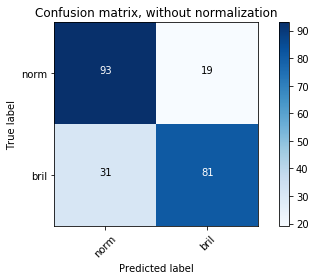

In [5]:
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.tight_layout()


plt.figure()
plot_confusion_matrix(confusion_matrix(Yval, y_pred), classes=['norm', 'bril'],
                      title='Confusion matrix, without normalization')

In [6]:
clf = classifier.fit(Xtrain, Ytrain)  
tree.export_graphviz(clf, out_file='tree.dot', feature_names = collist[2:], class_names= ['norm', 'bril'], filled=True)

from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

# Display in jupyter notebook
from IPython.display import Image
Image(filename = 'tree.png')

In [7]:
def make_decisions(originaldata, variable_list):
    data = originaldata[variable_list]
    training,validation = validation_split(data, 0.7)
    training = flatten(training, variable_list)
    validation = flatten(validation, variable_list)

    Xtrain = training.drop(['Conditie', 'SubjectID'], axis=1)
    Ytrain = training['Conditie']
    Xtrain = Xtrain.astype(float)
    Ytrain = Ytrain.astype(int)
    
    Xval = validation.drop(['Conditie', 'SubjectID'], axis=1)
    Yval = validation['Conditie']
    Xval = Xval.astype(float)
    Yval = Yval.astype(int)
    
    classifier = DecisionTreeClassifier(max_depth=6, min_samples_leaf=0.01)  
    classifier.fit(Xtrain, Ytrain)  
    y_pred = classifier.predict(Xval) 
    return accuracy_score(Yval, y_pred)


make_decisions(pdata, collist)

0.7991071428571429

In [8]:
print('Accuracy Scores for different variables (mean of 100 loops)')
print('BMI, Age, Som_afstand:', np.mean([make_decisions(pdata, ['SubjectID', 'Conditie', 'BMI', 'Age', 'Som_afstand']) for i in range(100)]))
print('BMI, Age, AverageStepLength:', np.mean([make_decisions(pdata, ['SubjectID', 'Conditie', 'BMI', 'Age', 'AverageStepLength']) for i in range(100)]))
print('BMI, Age, Som_afstand, AverageStepLength:', np.mean([make_decisions(pdata, ['SubjectID', 'Conditie', 'BMI', 'Age', 'AverageStepLength', 'Som_afstand']) for i in range(100)]))
print('BMI, Som_afstand, AverageStepLength:', np.mean([make_decisions(pdata, ['SubjectID', 'Conditie', 'BMI', 'AverageStepLength', 'Som_afstand']) for i in range(100)]))
print('Age, Som_afstand, AverageStepLength:', np.mean([make_decisions(pdata, ['SubjectID', 'Conditie', 'Age', 'AverageStepLength', 'Som_afstand']) for i in range(100)]))
print('Som_afstand, AverageStepLength:', np.mean([make_decisions(pdata, ['SubjectID', 'Conditie', 'AverageStepLength', 'Som_afstand']) for i in range(100)]))
print('Som_afstand, AverageStepLength, 6,0,01:', np.mean([make_decisions(pdata, ['SubjectID', 'Conditie', 'AverageStepLength', 'Som_afstand']) for i in range(100)]))


Accuracy Scores for different variables (mean of 100 loops)
BMI, Age, Som_afstand: 0.677232142857
BMI, Age, AverageStepLength: 0.789821428571
BMI, Age, Som_afstand, AverageStepLength: 0.789776785714
BMI, Som_afstand, AverageStepLength: 0.792901785714
Age, Som_afstand, AverageStepLength: 0.806294642857
Som_afstand, AverageStepLength: 0.802455357143
Som_afstand, AverageStepLength, 6,0,01: 0.800758928571


In [14]:
adata = pd.read_csv("../Data/preprocessed_alcoholdata_full.csv")
adata = adata.drop(["Unnamed: 0"], axis=1)
adata['Conditie'] = adata['Conditie'].map({'norm': 0,  'bril': 1})
adata['Alcohol'] = adata['Alcohol'].map({'Sober': 0,  'Light': 1, 'Tipsy': 2,  'Drunk': 3})
# adata

normdata = pd.read_csv("../Data/preprocessed_alcoholdata_full.csv")
normdata['Conditie'] = normdata['Conditie'].map({'norm': 0,  'bril': 1})
normdata = normdata.drop(normdata[normdata["Conditie"] > 0].index)
normdata['Alcohol'] = normdata['Alcohol'].map({'Sober': 0,  'Light': 1, 'Tipsy': 2,  'Drunk': 3})

In [31]:
variable_list = ['SubjectID', 'Alcohol', 'SumDistance', 'AverageStepLength']

data = adata[variable_list]
training,validation = validation_split(data, 0.7)
training = flatten(training, variable_list)
validation = flatten(validation, variable_list)

Xtrain = training.drop(['Alcohol', 'SubjectID'], axis=1)
Ytrain = training['Alcohol']
Xtrain = Xtrain.astype(float)
Ytrain = Ytrain.astype(int)

Xval = validation.drop(['Alcohol', 'SubjectID'], axis=1)
Yval = validation['Alcohol']
Xval = Xval.astype(float)
Yval = Yval.astype(int)

classifier = DecisionTreeClassifier(max_depth=5, min_samples_leaf=1)  
classifier.fit(Xtrain, Ytrain)  
y_pred = classifier.predict(Xval) 
accuracy_score(Yval, y_pred)

0.58244680851063835

In [32]:
clf = classifier.fit(Xtrain, Ytrain)  
tree.export_graphviz(clf, out_file='tree_alchohol.dot', feature_names = variable_list[2:], class_names= ['Sober',  'Light', 'Tipsy',  'Drunk'], filled=True)

from subprocess import call
call(['dot', '-Tpng', 'tree_alchohol.dot', '-o', 'tree_alcohol.png', '-Gdpi=600'])

# Display in jupyter notebook
from IPython.display import Image
Image(filename = 'tree_alcohol.png')

In [38]:
variable_list = ['SubjectID', 'Alcohol', 'SumDistance', 'AverageStepLength']

def make_alcohol_decisions(originaldata, variable_list):
    data = originaldata[variable_list]
    training,validation = validation_split(data, 0.7)
    training = flatten(training, variable_list)
    validation = flatten(validation, variable_list)

    Xtrain = training.drop(['Alcohol', 'SubjectID'], axis=1)
    Ytrain = training['Alcohol']
    Xtrain = Xtrain.astype(float)
    Ytrain = Ytrain.astype(int)
    
    Xval = validation.drop(['Alcohol', 'SubjectID'], axis=1)
    Yval = validation['Alcohol']
    Xval = Xval.astype(float)
    Yval = Yval.astype(int)
    
    classifier = DecisionTreeClassifier(max_depth=10, min_samples_leaf=0.1)  
    classifier.fit(Xtrain, Ytrain)  
    y_pred = classifier.predict(Xval) 
    return accuracy_score(Yval, y_pred)


make_alcohol_decisions(adata, variable_list)

0.57446808510638303

In [39]:
# print('Accuracy Scores for different variables (mean of 100 loops)')
# print('BMI, Age, SumDistance:', np.mean([make_alcohol_decisions(adata, ['SubjectID', 'Alcohol', 'BMI', 'Age', 'SumDistance']) for i in range(100)]))
# print('BMI, Age, AverageStepLength:', np.mean([make_alcohol_decisions(adata, ['SubjectID', 'Alcohol', 'BMI', 'Age', 'AverageStepLength']) for i in range(100)]))
# print('BMI, Age, SumDistance, AverageStepLength:', np.mean([make_alcohol_decisions(adata, ['SubjectID', 'Alcohol', 'BMI', 'Age', 'AverageStepLength', 'SumDistance']) for i in range(100)]))
# print('BMI, SumDistance, AverageStepLength:', np.mean([make_alcohol_decisions(adata, ['SubjectID', 'Alcohol', 'BMI', 'AverageStepLength', 'SumDistance']) for i in range(100)]))
# print('Age, SumDistance, AverageStepLength:', np.mean([make_alcohol_decisions(adata, ['SubjectID', 'Alcohol', 'Age', 'AverageStepLength', 'SumDistance']) for i in range(100)]))
print('SumDistance, AverageStepLength:', np.mean([make_alcohol_decisions(adata, ['SubjectID', 'Alcohol', 'AverageStepLength', 'SumDistance']) for i in range(100)]))
print('SumDistance, AverageStepLength:', np.mean([make_alcohol_decisions(normdata, ['SubjectID', 'Alcohol', 'AverageStepLength', 'SumDistance']) for i in range(100)]))

SumDistance, AverageStepLength: 0.57585106383
SumDistance, AverageStepLength: 0.562074468085
